# Real q=20 BMG digital-twin correction audit

This notebook uses the actual 18-plane × 4-repeat BeamGage acquisition in one
fixed camera coordinate system. It compares the measured stack, a Miao
input-plane inverse, a complete SLM/4F/axicon screen, and a calibrated
finite-energy q=20 target.

The corrected fields are model predictions, not post-correction measurements.
The nominal route passes its morphology and sampling gates. The inferred
residual gives only a small held-out improvement, so it remains a screening
result and hardware SLM2 export is blocked.

In [1]:
from pathlib import Path
import json, sys
import pandas as pd
from IPython.display import display, Image, Markdown

EXP = None
for base in (Path.cwd(), *Path.cwd().parents):
    candidate = base / "notebooks" / "experimental" / "axicon_aberration_correction"
    if (candidate / "real_bmg_digital_twin_correction.py").exists():
        EXP = candidate.resolve(); break
if EXP is None:
    raise FileNotFoundError("Open this notebook from the Publication_Study checkout")
ROOT = EXP.parents[2]
sys.path[:0] = [str(EXP), str(ROOT)]
import real_bmg_digital_twin_correction as bridge

DATA_DIR = bridge.find_bmg_dir()
groups = bridge.inventory(DATA_DIR)
OUT = EXP / "outputs" / "digital_twin_correction"
print("BMG directory:", DATA_DIR)
print("planes:", len(groups), "frames:", sum(map(len, groups.values())))
print("z relative (mm):", bridge.Z_REL_MM.tolist())
print("z hexapod (mm):", (bridge.Z_REL_MM + 6).tolist())

BMG directory: C:\PhD\Code\LabStuff\Axicon_AberrationCorrection\z-scan 2 1010
planes: 18 frames: 72
z relative (mm): [-17.0, -16.0, -15.0, -14.0, -13.0, -12.0, -11.0, -10.0, -9.0, -8.0, -7.0, -6.0, -5.0, -4.0, -3.0, -2.0, -1.0, 0.0]
z hexapod (mm): [-11.0, -10.0, -9.0, -8.0, -7.0, -6.0, -5.0, -4.0, -3.0, -2.0, -1.0, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0]


## Reproduction switch

Set `RUN_PIPELINE=True` to repeat the expensive real-BMG inverse and the
4096-point convergence spot check. It defaults to false so reopening this
executed notebook does not silently repeat the fit.

In [2]:
RUN_PIPELINE = False
if RUN_PIPELINE:
    bridge.run(DATA_DIR, OUT, recompute=True)
required = [OUT/"run_summary.json", OUT/"rerender_arrays.npz",
            OUT/"method_comparison_metrics_vs_z.csv"]
missing = [path for path in required if not path.exists()]
if missing:
    raise FileNotFoundError(f"Set RUN_PIPELINE=True; missing outputs: {missing}")
summary = json.loads((OUT/"run_summary.json").read_text(encoding="utf-8"))
print("cached real-data run loaded:", OUT)

cached real-data run loaded: C:\PhD\Code\Publication_Study\notebooks\experimental\axicon_aberration_correction\outputs\digital_twin_correction


## 1. Real measured data — fixed camera coordinates

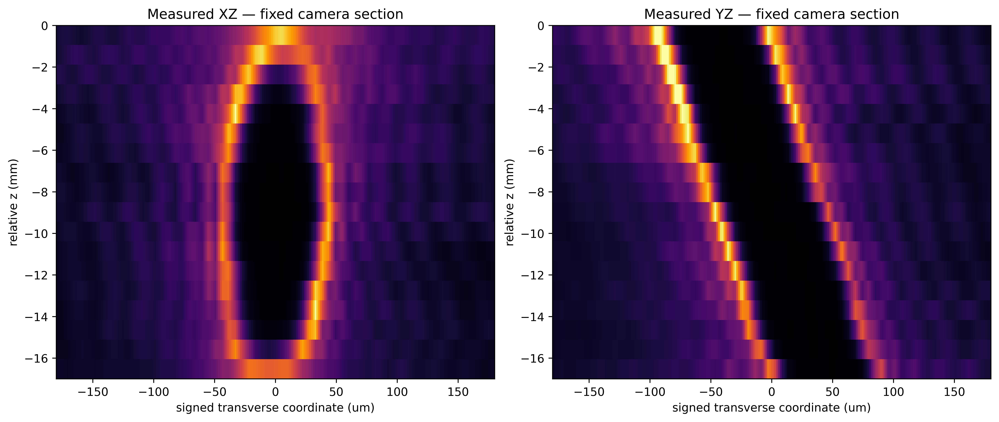

,value
x_slope_mrad,0.834365
y_slope_mrad,-5.352425
slope_magnitude_mrad,5.417068
end_to_end_x_um,16.5
end_to_end_y_um,-93.5
linear_rms_x_um,1.736492
linear_rms_y_um,2.4771
quadratic_rms_x_um,1.637455
quadratic_rms_y_um,2.470659
camera_stage_runout_separated,False


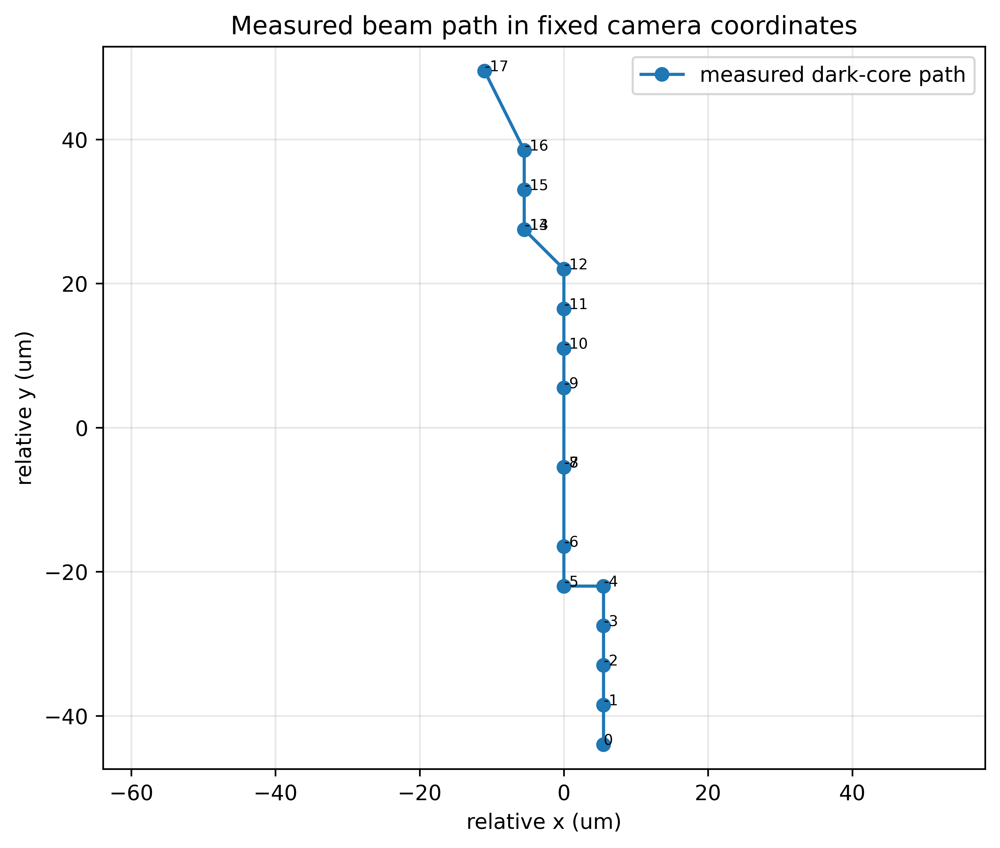

In [3]:
display(Image(filename=str(OUT/"01_measured_BMG_contact_sheet.png"), width=1300))
display(Image(filename=str(OUT/"02_measured_XZ_YZ_fixed_coordinates.png"), width=1200))
display(pd.DataFrame([summary["trajectory"]]).T.rename(columns={0:"value"}))
display(Image(filename=str(OUT/"05_measured_beam_path.png"), width=750))

The dark-core path has a 5.42 mrad fitted magnitude. Camera-stage runout has
not been independently measured, so the walk is preserved but cannot be
attributed uniquely to the axicon or input beam.

## 2. Measured radial scale and effective axicon

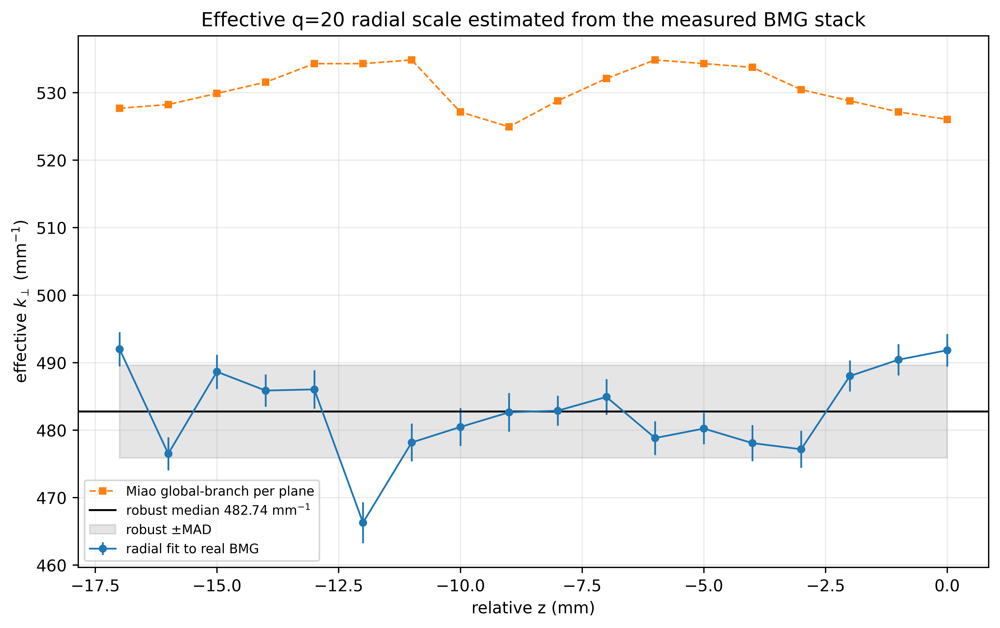

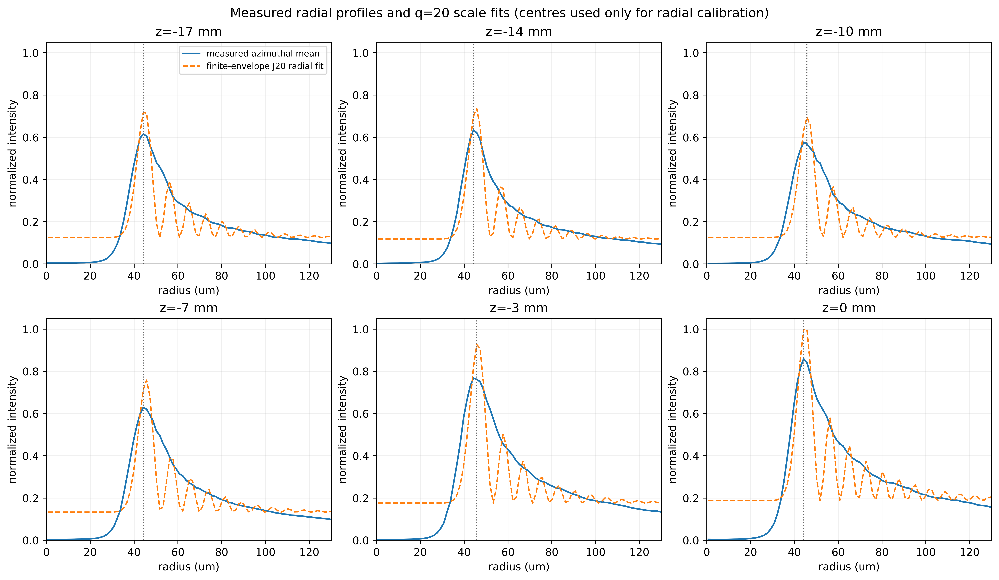

,real-stack robust k_perp (1/m),Miao median k_perp (1/m),effective internal base angle (deg),full cone departure (deg),manufacturer convention resolved
0,482741.414191,530168.422208,9.73768,19.47536,False


In [4]:
display(Image(filename=str(OUT/"measured_k_perp_vs_z.png"), width=1050))
display(Image(filename=str(OUT/"measured_radial_profiles_and_fit.png"), width=1250))
a = summary["effective_axicon"]
pd.DataFrame([{
 "real-stack robust k_perp (1/m)": a["measured_effective_k_perp_m_inv"],
 "Miao median k_perp (1/m)": summary["measured_k_perp_calibration"]["miao_median_m_inv"],
 "effective internal base angle (deg)": a["effective_internal_base_angle_deg"],
 "full cone departure (deg)": a["corresponding_full_cone_departure_deg"],
 "manufacturer convention resolved": a["manufacturer_convention_resolved"],
}])

Direct radial fits to all real planes give 482.74 mm⁻¹ (robust MAD
6.87 mm⁻¹), while the Miao global branch gives 530.17 mm⁻¹. The measured-ring
value maps to a 9.738° internal base angle and 19.475° full cone departure in
this model. Its proximity to the nominal “20°” is an inference, not a
datasheet conversion.

## 3. Hard nominal-model gate before inversion

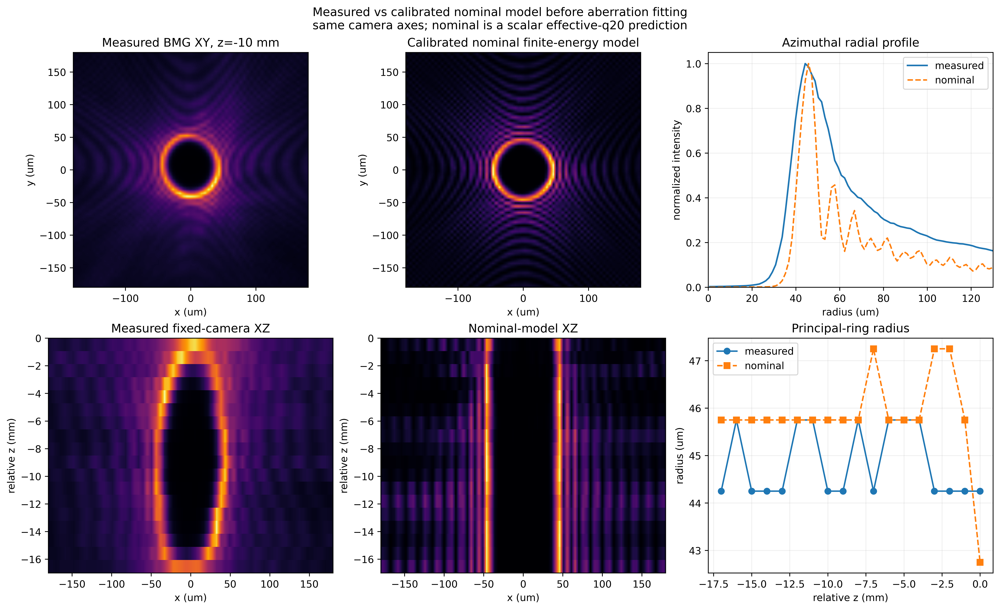

,mean_radial_profile_correlation,median_absolute_ring_radius_error_um,maximum_nominal_dark_core_to_ring,source_winding,source_winding_pass,samples_per_axicon_radial_phase_period,nominal_morphology_gate_pass,acceptance
0,0.912926,1.5,0.043624,"{'radius_0p70_mm': -7.000000000000001, 'radius...",True,2.663014,True,"{'mean_radial_profile_correlation_min': 0.5, '..."


In [5]:
display(Image(filename=str(OUT/"measured_vs_nominal_before_fitting.png"), width=1250))
pd.DataFrame([summary["nominal_morphology_gate"]])

This camera-scale figure is the required pre-inverse gate. The calibrated
finite-energy route produces a dark annular q=20 field, matches the ring scale,
and preserves +20 source winding on the illuminated annulus. The earlier
full-window view showed the preceding conical collapse and was not the
measured-region comparison.

## 4. Miao and physical-parameter screens

In [6]:
miao = summary["miao"]
b = summary["miao_single_phase_backcheck"]
display(pd.DataFrame([{
 "Miao path reliable": miao["k_perp_path_reliable"],
 "Miao mean modal fit r": miao["mean_global_fit_correlation"],
 "original Miao error recreates lab": b["supports_retrieved_phase_as_cause_of_measured_distortion"],
 "Miao hardware ready": miao["hardware_ready"],
}]))
p = summary["physical_screening"]
display(pd.DataFrame([
 {"quantity":"4F iris radius scale", **p["4f_iris_radius"]},
 {"quantity":"effective axicon lateral displacement", **p["effective_axicon_lateral_displacement"]},
]))
display(pd.read_csv(OUT/"physical_parameter_objective_scans.csv"))

,Miao path reliable,Miao mean modal fit r,original Miao error recreates lab,Miao hardware ready
0,False,0.82178,False,False


,quantity,selected,objective,minimum_on_search_boundary,values_within_5pct_of_minimum,units,objective_definition,camera_stage_runout_confounded
0,4F iris radius scale,1.15,0.185354,False,"[1.0, 1.15, 1.3]",ratio,"RMSE between centered azimuthally averaged, pl...",NaN
1,effective axicon lateral displacement,0.00,0.332591,False,[0.0],um along measured walk direction,RMSE of plane-normalized intensity-centroid tr...,True


,parameter,value,units,objective,selected,relative_to_min
0,4F iris radius scale,0.70,ratio,0.208432,False,0.124509
1,4F iris radius scale,0.85,ratio,0.205441,False,0.108370
2,4F iris radius scale,1.00,ratio,0.190292,False,0.026639
3,4F iris radius scale,1.15,ratio,0.185354,True,0.000000
4,4F iris radius scale,1.30,ratio,0.189104,False,0.020232
5,effective axicon lateral displacement,-500.00,um along measured walk direction,0.652152,False,0.960824
6,effective axicon lateral displacement,-250.00,um along measured walk direction,0.940003,False,1.826304
7,effective axicon lateral displacement,0.00,um along measured walk direction,0.332591,True,0.000000
8,effective axicon lateral displacement,250.00,um along measured walk direction,0.788787,False,1.371644
9,effective axicon lateral displacement,500.00,um along measured walk direction,0.491548,False,0.477935


The iris minimum is broad: 1.0, 1.15 and 1.3 are within 5%, so it is not a
precise hardware measurement. Both tested displacement routes prefer zero;
camera-stage runout remains a confounder. The Miao phase stays on its
reconstructed input/axicon plane and is never relabelled as an SLM2 mask.

## 5. Held-out residual and inverse-error back-check

In [7]:
r = summary["full_route_residual"]
display(pd.DataFrame([{
 "train r before": r["train_before"]["mean_pearson_r"],
 "train r after": r["train_after"]["mean_pearson_r"],
 "held-out r before": r["heldout_before"]["mean_pearson_r"],
 "held-out r after": r["heldout_after"]["mean_pearson_r"],
 "held-out RMSE before": r["heldout_before"]["mean_rmse"],
 "held-out RMSE after": r["heldout_after"]["mean_rmse"],
 "held-out improves both": r["heldout_improved_both_metrics"],
}]))
display(pd.DataFrame([summary["full_route_validation"]]))
display(Image(filename=str(OUT/"08_error_reconstruction_backcheck.png"), width=1400))

,train r before,train r after,held-out r before,held-out r after,held-out RMSE before,held-out RMSE after,held-out improves both
0,0.42089,0.439574,0.419146,0.422938,0.128055,0.12461,True


,decision,mean_error_reconstruction_pearson_r,mean_error_reconstruction_nrmse,correlation_gain_over_ideal_error_simulation,rmse_reduction_over_ideal_error_simulation,heldout_improved_both_metrics,sampling_3072_to_4096_converged,reason
0,MODEL_SCREENING_SUPPORTED_HARDWARE_BLOCKED,0.35744,0.154134,0.024073,0.00355,True,True,nominal route is physically coherent; residual...


Held-out planes improve only slightly. Applying the positive fitted error to
the ideal route raises mean real-stack correlation by about 0.024 and reduces
NRMSE by about 0.0036. Neither inferred error visually reproduces the measured
hourglass closely, so this is screening evidence rather than a resolved
aberration map.

## 6. High-resolution measured / corrected / ideal comparison

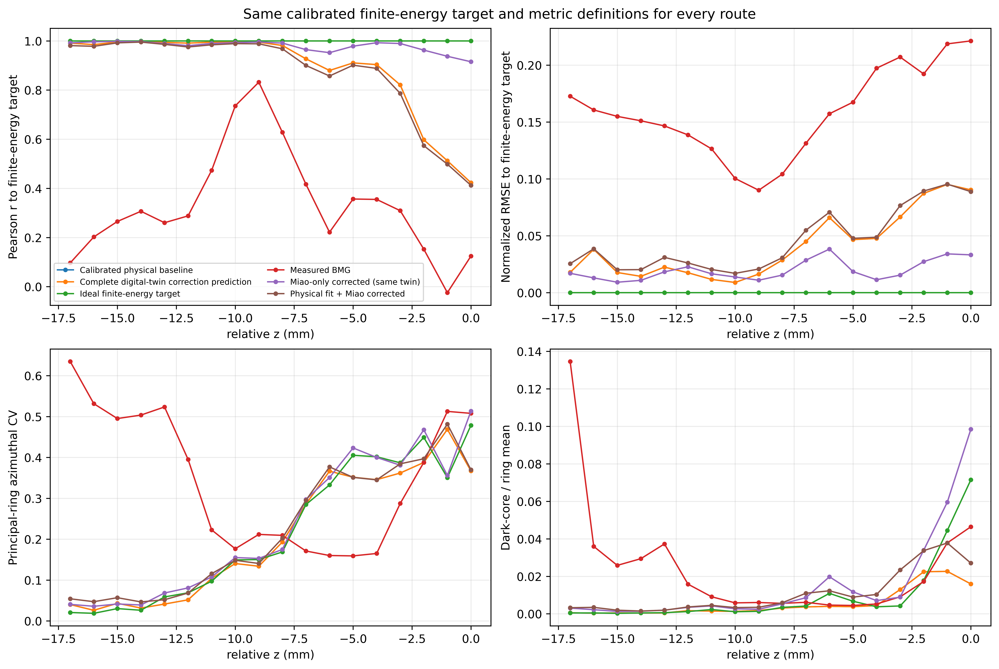

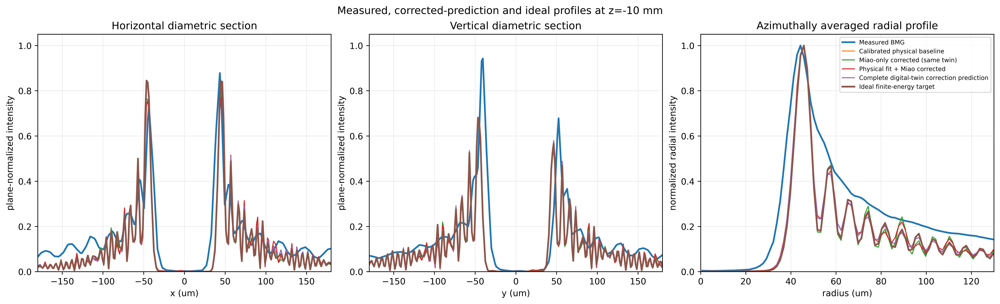

,method,mean_pearson_r,median_pearson_r,mean_nrmse,median_nrmse,median_ring_cv,maximum_dark_core_ratio
0,Calibrated physical baseline,0.883158,0.983150,0.041002,0.033371,0.166762,0.022653
1,Complete digital-twin correction prediction,0.883158,0.983150,0.041002,0.033371,0.166762,0.022653
2,Ideal finite-energy target,1.000000,1.000000,0.000000,0.000000,0.159498,0.071491
3,Measured BMG,0.333367,0.297442,0.157684,0.156116,0.337684,0.134572
4,Miao-only corrected (same twin),0.978566,0.989471,0.019696,0.016802,0.165007,0.098474
5,Physical fit + Miao corrected,0.869641,0.971577,0.045694,0.034787,0.175413,0.037779


In [8]:
display(Image(filename=str(OUT/"03_measured_miao_digital_twin_target_comparison.png"), width=1550))
display(Image(filename=str(OUT/"04_metrics_vs_z.png"), width=1200))
display(Image(filename=str(OUT/"09_measured_corrected_ideal_profile_comparisons.png"), width=1450))
display(pd.read_csv(OUT/"method_summary_metrics.csv"))

All numerical methods use the same downstream calibrated finite-energy twin.
The Miao-only output can remain close to ideal without proving that its inverse
explains the real error; the preceding positive-error back-check is therefore
the decisive companion figure. Dark-core metrics follow each beam centre and
do not erase the fixed-camera propagation walk.

## 7. Sampling audit

In [9]:
pd.read_csv(OUT/"sampling_convergence.csv")

,N,dx_um,samples_per_effective_radial_period,retained_spectral_power,mean_corr_to_finest,mean_rmse_to_finest
0,1536,6.510417,1.999201,1.0,0.745174,0.086311
1,2048,4.882812,2.665602,1.0,0.910799,0.048561
2,3072,3.255208,3.998403,1.0,0.981273,0.022945
3,4096,2.441406,5.331203,1.0,1.000000,0.000000


The relay/source window stays fixed at 10 mm. The final 3072 grid has four
samples per effective axicon phase period and agrees with the independent
4096-point spot check at mean correlation 0.981. The lower-resolution rows
show why the original single-grid result was unreliable.

## 8. Numerical SLM2 correction layer — not hardware-ready

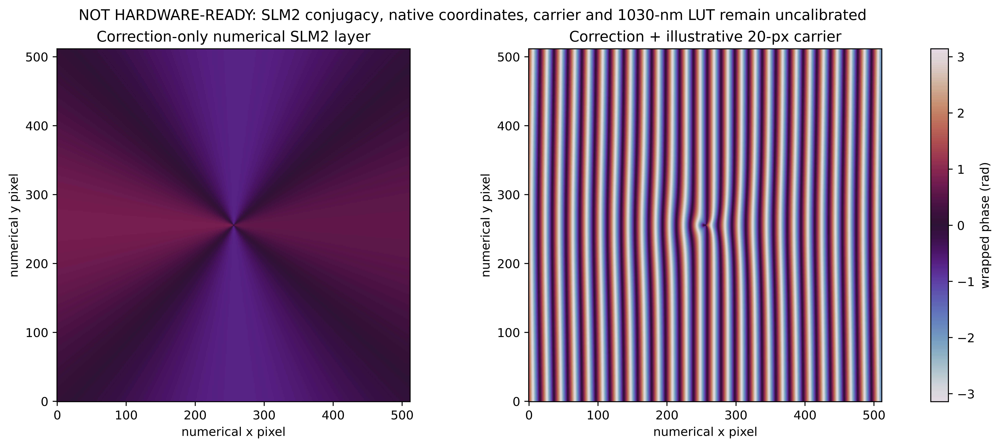

In [10]:
display(Image(filename=str(OUT/"06_predicted_SLM2_correction_phase.png"), width=1200))

The left panel is the correction-only additive numerical SLM2 layer and has no
q=20 vortex. The right panel adds an illustrative 20-pixel carrier. Neither is
a native hardware export: SLM2 conjugacy, native scale/centre/parity, real
carrier, branch sign and the 1030-nm phase LUT remain uncalibrated.

## 9. Measured and predicted-correction 3D XZ mesh

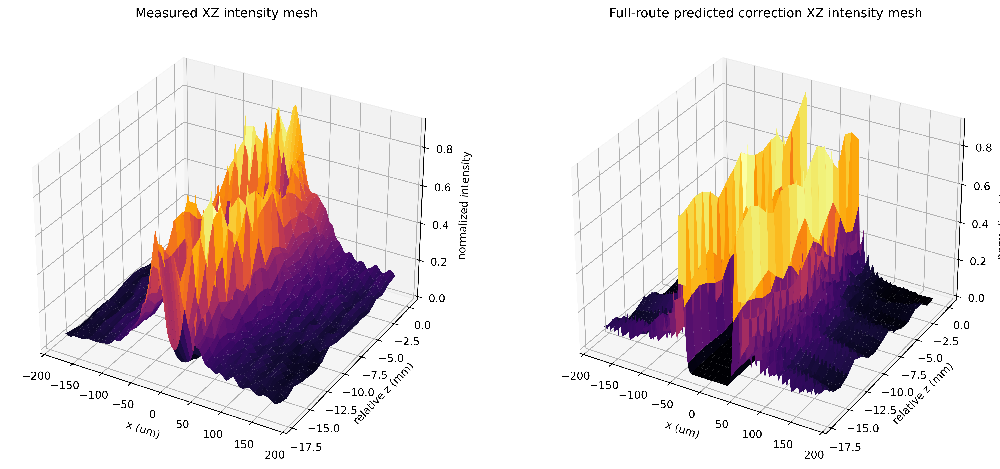

In [11]:
display(Image(filename=str(OUT/"07_measured_vs_corrected_3D_mesh.png"), width=1200))

## Final report and safety gates

In [12]:
display(Markdown((OUT/"SUMMARY.md").read_text(encoding="utf-8")))
assert summary["hardware_ready"] is False
assert summary["nominal_morphology_gate"]["nominal_morphology_gate_pass"] is True
assert summary["sampling"]["quantitative_high_angle_claim_allowed"] is True
assert summary["full_route_validation"]["decision"] == "MODEL_SCREENING_SUPPORTED_HARDWARE_BLOCKED"
print("Gates passed: coherent nominal model and converged figures; no hardware-ready SLM phase claimed.")

# Real q=20 BMG digital-twin correction summary

All corrected fields below are **model predictions**, not post-correction camera measurements.

- Raw input: 72 BMG files (18 z planes x 4 repeats).
- Physical z convention: hexapod -11...+6 mm maps to relative -17...0 mm.
- Effective k_perp: 482741.4 1/m.
- Effective repository-convention base angle from k_perp: 9.738 deg; manufacturer '20 deg' convention remains unverified.
- Measured beam-path slope: 5.417 mrad.
- Miao branch status: GLOBAL_K_PERP_PATH_UNRELIABLE; hardware ready: False.
- Full-route held-out status: SCREENING_PREDICTION_ONLY.
- Final full-route decision: MODEL_SCREENING_SUPPORTED_HARDWARE_BLOCKED.
- SLM2 output is a numerical-grid phase proposal only; native mapping/LUT export is blocked.

- Nominal morphology gate: True (mean radial r=0.913, median ring-radius error=1.50 um).
- Axicon-grid convergence claim allowed: True.

## Mean/median finite-energy-target metrics

| method | mean_pearson_r | median_pearson_r | mean_nrmse | median_nrmse | median_ring_cv | maximum_dark_core_ratio |
| --- | --- | --- | --- | --- | --- | --- |
| Calibrated physical baseline | 0.88316 | 0.98315 | 0.041002 | 0.033371 | 0.16676 | 0.022653 |
| Complete digital-twin correction prediction | 0.88316 | 0.98315 | 0.041002 | 0.033371 | 0.16676 | 0.022653 |
| Ideal finite-energy target | 1 | 1 | 0 | 0 | 0.1595 | 0.071491 |
| Measured BMG | 0.33337 | 0.29744 | 0.15768 | 0.15612 | 0.33768 | 0.13457 |
| Miao-only corrected (same twin) | 0.97857 | 0.98947 | 0.019696 | 0.016802 | 0.16501 | 0.098474 |
| Physical fit + Miao corrected | 0.86964 | 0.97158 | 0.045694 | 0.034787 | 0.17541 | 0.037779 |

## Interpretation

The previous stripe fields were numerical: a 5.632-mm source window clipped the displaced +1 order, while widening that same single grid without refinement aliased the measured high-k_perp axicon phase. The corrected multirate route uses a 10-mm relay window and a finer fixed-window axicon grid. It reproduces the basic q=20 annulus before fitting. The fitted low-order residual improves both train and untouched held-out planes only slightly, so it remains a screening prediction rather than a demonstrated hardware correction. Miao input-plane phase and numerical SLM2 phase are kept as distinct planes. Hardware use remains blocked by camera-stage axis, absolute z, vector high-angle response, SLM2 conjugacy/native coordinates, the 1030-nm LUT, branch sign, and a new post-mask BMG acquisition.


Gates passed: coherent nominal model and converged figures; no hardware-ready SLM phase claimed.
